In [1]:

import pandas as pd
import numpy as np
#plot above but with plotly
import plotly.express as px

import matplotlib.pyplot as plt  
import numpy as np  
import seaborn as sns  
import matplotlib.dates as mdates  # Importação adicional  
plt.style.use('default')  

In [42]:
df = pd.read_parquet('dataframeFV.parquet')
df['Datetime'] = pd.to_datetime(df['Dia'].astype(str) + ' ' + df['Hora'].astype(str))
df = df.set_index('Datetime')
df.drop(columns=['Dia', 'Hora', 'nom_subsistema','nom_estado','id_ons','Mes','din_instante','val_geracaoreferenciafinal'], inplace=True)
colunas = ['val_geracao','val_geracaolimitada','val_disponibilidade','val_geracaoreferencia','geracao_frustrada','Geracao MWh','Geracao frustrada MWh']
df[colunas] = df[colunas].fillna(0)
df.to_parquet('dataframeFV2.parquet')

In [43]:
df = pd.read_parquet('dataframeEOL.parquet')
df['Datetime'] = pd.to_datetime(df['Dia'].astype(str) + ' ' + df['Hora'].astype(str))
df = df.set_index('Datetime')
df.drop(columns=['Dia', 'Hora', 'nom_subsistema','nom_estado','id_ons','Mes','din_instante','val_geracaoreferenciafinal'], inplace=True)
colunas = ['val_geracao','val_geracaolimitada','val_disponibilidade','val_geracaoreferencia','geracao_frustrada','Geracao MWh','Geracao frustrada MWh']
df[colunas] = df[colunas].fillna(0)
df.to_parquet('dataframeEOL2.parquet')

In [3]:
df_luzia = df[df['nom_usina'].str.contains('SANTA LUZIA')]
df_luzia.drop(columns=['Dia', 'Hora', 'nom_subsistema','nom_estado','id_ons','Mes'], inplace=True)
colunas = ['val_geracao','val_geracaolimitada','val_disponibilidade','val_geracaoreferencia','geracao_frustrada','Geracao MWh','Geracao frustrada MWh']
#fill missing values with zero of df_luzia[colunas]
df_luzia[colunas] = df_luzia[colunas].fillna(0)
RAZOES = ['ENE', 'CNF', 'REL']

C:\Users\cangica\AppData\Local\Temp\ipykernel_15524\9649255.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_luzia.drop(columns=['Dia', 'Hora', 'nom_subsistema','nom_estado','id_ons','Mes'], inplace=True)
C:\Users\cangica\AppData\Local\Temp\ipykernel_15524\9649255.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_luzia[colunas] = df_luzia[colunas].fillna(0)


In [4]:
dftemp = df_luzia #loc['2024-12-28']

fig = px.line(dftemp, x=dftemp.index, y=colunas, title='Luzia - ' + RAZOES[0])
fig.update_layout(xaxis_title='Datetime', yaxis_title='Values')
fig.show()


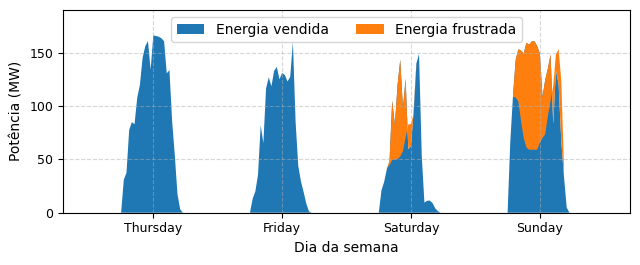

In [5]:
inicio = '2024-04-18 00:00:00'  
fim = '2024-04-22 00:00:00'  

rioalto3 = df[df['nom_usina'].str.contains('RIO ALTO')]
rioalto3 = rioalto3.loc[inicio:fim]

# Criando o gráfico  
plt.figure(figsize=(7.8 / 1.2, 3.3 / 1.2))   
plt.grid(True, linestyle='--', alpha=0.5)  

plt.fill_between(  
    rioalto3.index,  
    rioalto3.val_geracaoreferencia,  
    label='Energia vendida'  
)  

# Preenchendo a área da energia não exportada devido à limitação  
plt.fill_between(  
    rioalto3.index,  
    rioalto3.val_geracaolimitada,  
    rioalto3.val_geracaoreferencia,    
    label='Energia frustrada'  
)  

# Personalizando o gráfico  
plt.xlabel('Dia da semana', fontsize=10)  
plt.ylabel('Potência (MW)', fontsize=10)  
plt.grid(True, linestyle='--', alpha=0.5)  
plt.legend(fontsize=10, loc='upper center', ncol=2)  

plt.ylim(0, 190)  
plt.xticks(size=9)  

ax = plt.gca()  
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=12))  # Ticks às 12h de cada dia  
ax.xaxis.set_major_formatter(mdates.DateFormatter('%A'))    # Formato do dia da semana por extenso  

plt.yticks(size=9)  
plt.tight_layout()  

#plt.savefig('constrainedoff.pdf', dpi=300)  # Salva o gráfico como PDF  
# Exibindo o gráfico  
plt.show()

In [23]:
import plotly.graph_objects as go

inicio = '2024-04-18 00:00:00'  
fim = '2025-04-22 00:00:00'  

rioalto3 = df[df['nom_usina'].str.contains('RIO ALTO')]
rioalto3 = rioalto3.loc[inicio:fim]

# --- Criando o gráfico com Plotly ---

# Crie a figura
fig = go.Figure()

# Adiciona a área de "Energia vendida" (a base)
fig.add_trace(go.Scatter(
    x=rioalto3.index,
    y=rioalto3.val_geracaolimitada,
    mode='lines',
    line=dict(width=0), # Linha do contorno invisível
    fill='tozeroy',    # Preenche a área do eixo Y até a linha
    name='Energia vendida',
    stackgroup='one', # Agrupa as áreas para empilhamento,
    line_shape='hv',
    #fillcolor='blue',
    # Cor verde com transparência
))

# Adiciona a área de "Energia frustrada" (diferença que empilha em cima)
fig.add_trace(go.Scatter(
    x=rioalto3.index,
    y=rioalto3.val_geracaoreferencia - rioalto3.val_geracaolimitada,
    mode='lines',
    line=dict(width=0),
    fill='tonexty', # Preenche a área da linha anterior até a atual
    name='Energia frustrada',
    stackgroup='one',
    line_shape='hv'
))

# --- Personalizando o layout do gráfico ---
fig.update_layout(
    title='Geração de Energia: Vendida vs. Frustrada',
    xaxis_title='Dia da Semana',
    yaxis_title='Potência (MW)',
    yaxis_range=[0, 190],
    legend=dict(
        orientation="h", # Legenda na horizontal
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    template='plotly_white', # Fundo branco similar ao matplotlib
    width=800,
    height=400,
    font=dict(size=12),
    
)

# Configura o grid (grade)
fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGray', griddash='dash')
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGray', griddash='dash')

# Configura os ticks do eixo X para mostrar o dia da semana
# O Plotly faz isso de forma mais automática, mas você pode forçar o formato
fig.update_xaxes(
    dtick="D1", # Um tick por dia
    #tickformat="%A" # Formato para mostrar o nome completo do dia da semana
)


# Exibe o gráfico interativo
fig.show()


In [24]:
inicio = '2024-06-01 00:00:00'  
fim = '2024-06-02 00:00:00'  

rioalto3 = df[df['nom_usina'].str.contains('RIO ALTO')]
rioalto3 = rioalto3.loc[inicio:fim]

In [32]:
rioalto3.val_geracaoreferencia - rioalto3.val_geracaolimitada

Datetime
2024-06-01 00:00:00        NaN
2024-06-01 00:30:00        NaN
2024-06-01 01:00:00        NaN
2024-06-01 01:30:00        NaN
2024-06-01 02:00:00        NaN
2024-06-01 02:30:00        NaN
2024-06-01 03:00:00        NaN
2024-06-01 03:30:00        NaN
2024-06-01 04:00:00        NaN
2024-06-01 04:30:00        NaN
2024-06-01 05:00:00        NaN
2024-06-01 05:30:00        NaN
2024-06-01 06:00:00        NaN
2024-06-01 06:30:00        NaN
2024-06-01 07:00:00     75.344
2024-06-01 07:30:00     89.716
2024-06-01 08:00:00     72.043
2024-06-01 08:30:00     67.146
2024-06-01 09:00:00    111.034
2024-06-01 09:30:00    106.607
2024-06-01 10:00:00    109.410
2024-06-01 10:30:00    108.216
2024-06-01 11:00:00     90.750
2024-06-01 11:30:00     82.124
2024-06-01 12:00:00     71.584
2024-06-01 12:30:00     51.403
2024-06-01 13:00:00     46.435
2024-06-01 13:30:00     34.867
2024-06-01 14:00:00     22.820
2024-06-01 14:30:00    -13.262
2024-06-01 15:00:00    -49.396
2024-06-01 15:30:00    -13.417

In [28]:
rioalto3.geracao_frustrada.sum()

1217.371